# Import library and data

This installation will allow us to use the panda profiling function to analyse our data and have a better understanding of our work ressources.

In [31]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [32]:
import math
import sklearn.metrics 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

from sklearn import preprocessing
from sklearn import tree
from IPython.display import Image
from subprocess import check_call
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFECV
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier 
from sklearn.linear_model import LogisticRegression

In [33]:
def is_nan(value):
    return math.isnan(float(value))

In [34]:
data = pd.read_csv("diabetic_data.csv")
id_map = pd.read_csv("IDs_mapping.csv")

# Visualize data


In [35]:
data

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [36]:
data.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [37]:
profile = ProfileReport(data, title='Pandas Profiling Report', html={'style':{'full_width':False}})
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data selection

Our reading of the dataset description let us decide to drop some features for three reasons :


*   Irrelevant ones : encounter_id, patient_number, number_inpatient, number_outpatient, discharge_disposition_id, payer_code , num_lab_procedures, num_procedures, number_emergency
*   Missing ones : weight (97% missing) and medical_speciality      (53% missing)
*   Uninformative ones (they take one unique value) : examide, citoglipton, metformin-pioglitazone

In [38]:
first_selection = data.drop(["examide","citoglipton","metformin-pioglitazone","weight", "number_emergency", "payer_code", "num_lab_procedures", "num_procedures", "encounter_id", "patient_nbr", "medical_specialty", "number_inpatient", "number_outpatient", "discharge_disposition_id" ], axis = 1)

After reading the profiling report we decided to drop the following features because they don't contains any information (they take almost all the same value):
- acetohexamide
- tolbutamide
- troglitazone
- tolazamide
- glipizide-metformin
- glimepiride-pioglitazone
- metformin-rosiglitazone

In [39]:
selected_data = first_selection.drop(["acetohexamide","tolbutamide","troglitazone","tolazamide","glipizide-metformin","glimepiride-pioglitazone","metformin-rosiglitazone"], axis = 1)

# Data cleaning and modifying

Thanks to the profiling we have seen that the missing value are not using the default NaN value of python but three different kind of value : "nan" (as a string), "?", "None".
We have to choose and set one unique value for the same information.
We used the numpy nan to be able to use the dropna function over our dataframe.

In [40]:
cleaned_data = selected_data
cleaned_data.replace(to_replace='nan',value= np.nan, inplace=True)
cleaned_data.replace(to_replace="?",value= np.nan, inplace=True)
cleaned_data.replace(to_replace="None",value= np.nan, inplace=True)
cleaned_data = cleaned_data.dropna()

Some race data are missing or uncorrect so we iterate over them and set a unique value for them as missing.

In [41]:
for name, values in cleaned_data['race'].iteritems():
  if type(values) != str and is_nan(values):
    cleaned_data['race'][name] = 'Missing'

We decided to change the output from not readmitted, readmitted before 30 days or after 30 days to readmitted or not readmitted. This allow to have only one output.

In [42]:
cleaned_data['readmitted'].replace(['NO','<30','>30'],[0,1,1],inplace = True)

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


We apply a last dropna over our dataframe to ensure all the NaN value are dropped

In [43]:
to_work = cleaned_data.dropna()

#Split Train and Test

We create a dataframe X without the output it will containt only input features and y containing only the output feature.
We use the sklearn function "train_test_split" from the model_selection to split our dataframe in two : 70% of the data for the training and 30% for testing and validating.
We're setting a random_state value to have the same splitting and not a new one each time we launch the function.

In [44]:
X = to_work.drop('readmitted', axis=1) 
y = to_work['readmitted'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

# Usefull functions for model analysis

We could have used the default roc_auc from sklearn metrics but we decided to create our own function to be able to choose if we want to plot and have a visualization of our model's performance.

In [45]:
def roc_auc(pred, act, plot=True, label = "curve"):
    prob = pred/pred.max() #normalize
    fpr, tpr, threshold = sklearn.metrics.roc_curve(act, prob, drop_intermediate=True)    
    auc = sklearn.metrics.auc(fpr, tpr)
    if plot:
        plt.scatter(x=fpr, y=tpr, color='black')
        rcolor = tuple(np.random.rand(3,1)[:,0])
        plt.plot(fpr, tpr, c=rcolor, lw=2, label=label + ' (AUC = %0.3f)' % auc)
        plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.legend(loc="upper left")
        plt.show()
    return auc

# Tree Classifying

We create different dataframe from the different train and test to be able to work on them for the tree classifiying without modifying the initial data and use them for other model.

In [46]:
X_train_tree, X_test_tree = X_train, X_test
y_train_tree, y_test_tree = y_train, y_test

We created a list of all our categorical features to be able later to apply the sklearn label encoder. 

In [47]:
categorical_features =['race', 'gender', 'age', 'admission_type_id', 'admission_source_id', 'diag_1', 'diag_2', 'diag_3', 'number_diagnoses',
       'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'nateglinide','chlorpropamide', 'glimepiride', 'glipizide', 'glyburide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'insulin', 'glyburide-metformin', 'change', 'diabetesMed'] 

We use the label encoder to replace categorical features value in numerical value and apply machine learning algorithm over them.

In [48]:
le = LabelEncoder()
for feature in categorical_features:
  X_train_tree[feature], X_test_tree[feature]= le.fit_transform(X_train_tree[feature]), le.fit_transform(X_test_tree[feature])  

We instantiate our random forest classifier with 100 estimators to find the best models we can find.
Then we apply the recursive feature elimination to select features that are usefull or not. For the estimator we use our previous classifier, we use 5 folds for cross validation (cv), we want to reduce the verbosity so we set it to 0. To end this selection we use 10 cores to run in parallele.
When this is done we fit our model with our traing data.

In [49]:
rfc_rfe = RandomForestClassifier(n_estimators = 1000)
rfe = RFECV(estimator=rfc_rfe, cv=5, verbose=0, n_jobs=-1)
rfe.fit(X_train_tree, y_train_tree)

RFECV(cv=5, estimator=RandomForestClassifier(n_estimators=1000), n_jobs=-1)

In [50]:
X = X_train_tree
feat_ranks = pd.Series(index=X.columns, data=rfe.ranking_)
rf_feats = feat_ranks[feat_ranks==1].index
len(feat_ranks)

28

In [51]:
len(rf_feats)

20

In [52]:
X_test_red = rfe.transform(X_test)
X_train_red = rfe.transform(X_train)

rfc = rfe.estimator_

feat_imp = pd.Series(index=rf_feats, data=rfc.feature_importances_)
feat_imp.sort_values(ascending=False).head(20)

num_medications        0.139618
diag_3                 0.125398
diag_2                 0.118745
diag_1                 0.107916
time_in_hospital       0.098043
age                    0.062735
race                   0.047366
number_diagnoses       0.046513
max_glu_serum          0.038530
A1Cresult              0.036920
insulin                0.031050
gender                 0.024050
diabetesMed            0.021988
change                 0.021983
metformin              0.017651
glipizide              0.017511
admission_source_id    0.015796
admission_type_id      0.014732
repaglinide            0.006908
rosiglitazone          0.006548
dtype: float64

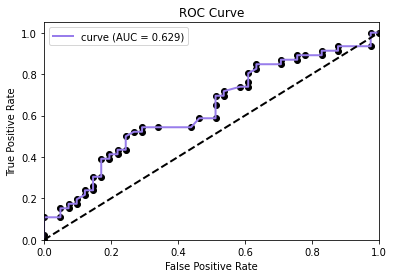

0.6291092258748674

In [53]:
pred = rfc.predict_proba(X_test_red)[:,1]
roc_auc(pred, y_test)

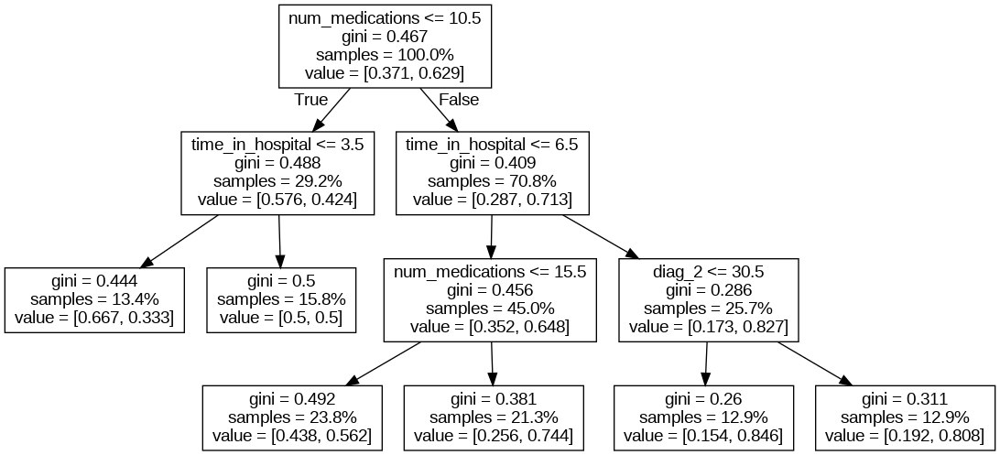

In [54]:
dtc = DecisionTreeClassifier(min_samples_leaf=0.125, min_samples_split=0.125)
dtc.fit(X_train_red, y_train)
tree.export_graphviz(dtc, out_file="tree.dot", feature_names=rf_feats, proportion=True)
check_call(['dot','-Tpng','tree.dot','-o','tree.png'])
Image(filename='tree.png')

# Logistic Regression

We create different dataframe from the different train and test to be able to work on them for the logistic regression without modifying the initial data and use them for other model.

In [55]:
X_train_lr, X_test_lr = X_train, X_test
y_train_lr, y_test_lr = y_train, y_test

We instanciate our logistic regression model. We use the newton-cg solver because we have a large dataset. We used the balanced class weight to automatically adjust weights inversely proportional to class frequencies in the input data

In [56]:
log_model = LogisticRegression(solver = "newton-cg", class_weight="balanced")

We then fit the model to our training datasets

In [57]:
log_model.fit(X_train_lr, y_train_lr)

LogisticRegression(class_weight='balanced', solver='newton-cg')

After training our model we want to plot the ROC Curve and find the AUC value wich is : 0.607

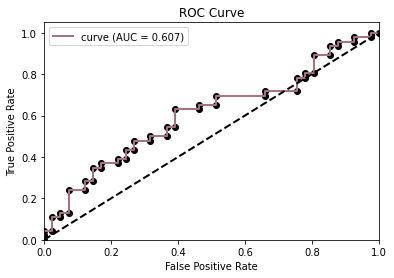

0.606574761399788

In [58]:
y_test_preds = log_model.predict_proba(X_test)[:,1]

roc_auc(y_test_preds, y_test)

We create a function to be able to find the most efficient threshold value.

In [59]:
def print_report(y_actual, y_pred, thresh):
    accuracy = sklearn.metrics.accuracy_score(y_actual, (y_pred > thresh))
    recall = sklearn.metrics.recall_score(y_actual, (y_pred > thresh))
    precision = sklearn.metrics.precision_score(y_actual, (y_pred > thresh))
    fscore = sklearn.metrics.f1_score(y_actual,(y_pred > thresh))
    return accuracy, recall, precision,fscore

We're calculating and evaluating our model for different threshold values between 0.4 and 0.6.

In [60]:
r = []
z = list(np.arange(0.4,0.61,0.01))
for i in z:
  r.append(print_report(y_test_lr, y_test_preds, i))

Y = [[],[],[],[]]

for i in r:
  Y[0].append(i[0])
  Y[1].append(i[1])
  Y[2].append(i[2])
  Y[3].append(i[3])

We're printing the evaluation result to be able to see the effect on the threshold modification.

Text(0.5, 1.0, 'F-Score')

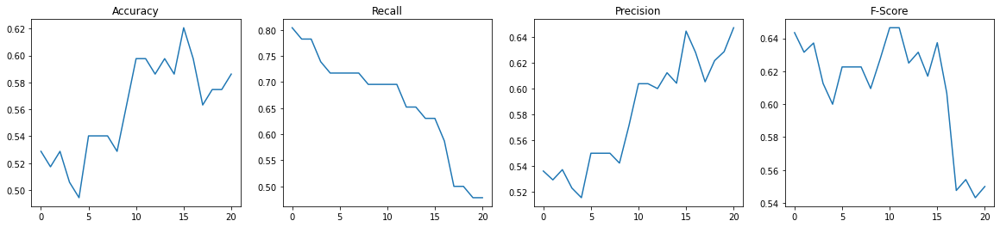

In [61]:
xbase = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
f = plt.figure()
f.set_figwidth(20)
plt.subplot(1, 4, 1)
plt.plot(xbase, Y[0])
plt.title("Accuracy")
plt.subplot(1, 4, 2)
plt.plot(xbase, Y[1])
plt.title("Recall")
plt.subplot(1, 4, 3)
plt.plot(xbase, Y[2])
plt.title("Precision")
plt.subplot(1, 4, 4)
plt.plot(xbase, Y[3])
plt.title("F-Score")

To find the optimum value we try to find the best accuracy and recall with the minimisation of the gap between these two values.

In [62]:
print("Threshold : ",z[Y[0].index(max(Y[0]))].round(2))
print("Max accuracy : ",max(Y[0]))
print("Precision : ",Y[2][Y[0].index(max(Y[0]))])
print("Diff : ", abs(Y[2][Y[0].index(max(Y[0]))] - max(Y[2])))
print("Threshold : ",z[Y[2].index(max(Y[2]))].round(2))
print("Max precision : ",max(Y[2]))
print("Accuracy : ",Y[0][Y[2].index(max(Y[2]))])
print("Diff : ", abs(Y[0][Y[2].index(max(Y[2]))] - max(Y[0])))

Threshold :  0.55
Max accuracy :  0.6206896551724138
Precision :  0.6444444444444445
Diff :  0.002614379084967311
Threshold :  0.6
Max precision :  0.6470588235294118
Accuracy :  0.5862068965517241
Diff :  0.034482758620689724


With these result we decided to select the threshold value that are minimising the gap between accuracy and precision : 0.58

In [63]:
optithresh = 0.58
accuracy, recall, precision, fscore = print_report(y_test_lr, y_test_preds, optithresh)
print("Accuracy : ",round(accuracy,3))
print("Recall : ",round(recall,3))
print("Precision : ",round(precision,3))
print("F-score : ", round(fscore,3))

Accuracy :  0.575
Recall :  0.5
Precision :  0.622
F-score :  0.554


Then we're predicting the value on the testing set and ploting the confusion matrix to have a better view of our model's prediction.

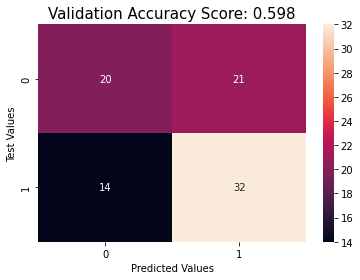

In [64]:
predictions = log_model.predict(X_test_lr)
val_score = round(sklearn.metrics.accuracy_score(y_test, predictions), 3)
cm_val = sklearn.metrics.confusion_matrix(y_test, predictions)

fig = plt.figure() 
sns.heatmap(cm_val, annot=True, fmt=".0f")
plt.xlabel('Predicted Values')
plt.ylabel('Test Values')
plt.title('Validation Accuracy Score: {0}'.format(val_score), size = 15)
plt.show()

# Neural Network

We create different dataframe from the different train and test to be able to work on them for the nerual network without modifying the initial data and use them for other model.
At this we're splitting the testing set in two set to obtain a validation set.
The proportion are : 
- 70% training
- 15% testing
- 15% validating

In [65]:
X_train_nn, X_test_nn = X_train, X_test
y_train_nn, y_test_nn = y_train, y_test
X_test_nn, X_val_nn, y_test_nn, y_val_nn = train_test_split(X_test_nn, y_test_nn, test_size=0.5, random_state=7)

We use the MinMaxScaler from sklearn to normalize the data by scaling them in value in range (0,1).

In [66]:
scaler = preprocessing.MinMaxScaler()
X_train_nn, X_test_nn, X_val_nn = scaler.fit_transform(X_train_nn), scaler.fit_transform(X_test_nn), scaler.fit_transform(X_val_nn)

We are extacting the input shape from the training input dataset.

In [67]:
input_shape = [X_train_nn.shape[1]]

We create a neural network model with 11 differents layers.

After creating the model we're printing the summary to have a view of the number of trainable parameters.

In [69]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=64, activation='sigmoid',input_shape=input_shape),
    tf.keras.layers.Dense(units=128, activation='sigmoid'),
    tf.keras.layers.Dense(units=256, activation='sigmoid'),
    tf.keras.layers.Dense(units=128, activation='sigmoid'),
    tf.keras.layers.Dense(units=64, activation='sigmoid'),
    tf.keras.layers.Dense(units=32, activation='sigmoid'),
    tf.keras.layers.Dense(units=16, activation='sigmoid'),
    tf.keras.layers.Dense(units=8, activation='sigmoid'),
    tf.keras.layers.Dense(units=4, activation='sigmoid'),
    tf.keras.layers.Dense(units=2, activation='sigmoid'),
    tf.keras.layers.Dense(units=1)
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                1856      
                                                                 
 dense_1 (Dense)             (None, 128)               8320      
                                                                 
 dense_2 (Dense)             (None, 256)               33024     
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dense_4 (Dense)             (None, 64)                8256      
                                                                 
 dense_5 (Dense)             (None, 32)                2080      
                                                                 
 dense_6 (Dense)             (None, 16)                5

For the compiling phase we've selected the adam optimizer which is really great for most of use case and for the metrics function we've choosed the mae because it is more efficient for numerical prediction and for the loss the mse.

In [70]:
model.compile(optimizer='adam',
              loss='mse',
              metrics=['mae']) 

Then we train our model by using the training set and the validation one.

In [74]:
losses = model.fit(X_train_nn, y_train_nn,
                   validation_data=(X_val_nn, y_val_nn),
                   batch_size=256,
                   epochs=500,
                   verbose = 0
                   )

We then plot the loss value and the validation loss value to verify that our model is not overfitting the data. As we don't observe an increase in the validation loss we can conclude that there is no overfitting.

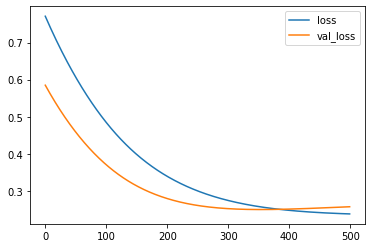

In [75]:
loss_df = pd.DataFrame(losses.history)
loss_df.loc[:,['loss','val_loss']].plot()

We then want to observe the efficacity of our model we are using the testing set to calculate the loss and accuracy.

In [76]:
score = model.evaluate(X_test_nn, y_test_nn, verbose = 0) 

print('Test loss:', score[0]) 
print('Test accuracy:', score[1])

Test loss: 0.24367573857307434
Test accuracy: 0.4895736873149872
